#  Telecom Churn case study

In [1]:
## Problem Statement:

In [2]:
## Approach:

#### Importing libraries

In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn import svm

%matplotlib inline
from datetime import datetime
from sklearn.model_selection import GridSearchCV,train_test_split,RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
from sklearn import metrics
from sklearn.metrics import plot_roc_curve,confusion_matrix,precision_score,recall_score,classification_report,accuracy_score
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA

import warnings
warnings.filterwarnings('ignore')

#### Reading the files and setting the option to display full message.

In [4]:
telecom_df = pd.read_csv('train.csv/train.csv')
test_df = pd.read_csv('test/test.csv')
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

#### Exploring the data

In [5]:
i_rows,i_cols = telecom_df.shape

In [6]:
telecom_df.columns

Index(['id', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'arpu_6', 'arpu_7',
       ...
       'sachet_3g_7', 'sachet_3g_8', 'fb_user_6', 'fb_user_7', 'fb_user_8',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'churn_probability'],
      dtype='object', length=172)

In [7]:
date_cols = ['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_data_6',
            'date_of_last_rech_data_7','date_of_last_rech_data_8']

In [8]:
cat_cols = ['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8']

In [9]:
telecom_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Columns: 172 entries, id to churn_probability
dtypes: float64(135), int64(28), object(9)
memory usage: 91.9+ MB


In [10]:
telecom_df.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,07-10-2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,06-12-2014,07-10-2014,8/26/2014,0,0,0,NaN,07-08-2014,NaN,NaN,1.0,NaN,NaN,145.0,NaN,NaN,0.0,NaN,NaN,1.0,N

In [11]:
telecom_df.describe()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69999.0,69297.0,69297.0,69297.0,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,69999.000000,69999.000000

#### Data manipulation

In [12]:
## Drop columns where only one value is there or different value exists for every row.
unique_cols = ['id','circle_id','loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','last_date_of_month_6',
               'last_date_of_month_7','last_date_of_month_8',
               'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8',
               'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7','std_ic_t2o_mou_8']

telecom_df.drop(unique_cols,axis=1,inplace=True)
test_df.drop(unique_cols,axis=1,inplace=True)

In [13]:
for col in date_cols:
    telecom_df[col]=pd.to_datetime(telecom_df[col])
    test_df[col]=pd.to_datetime(test_df[col])

In [14]:
## Derving the value of last recharge based on the date of recharge columns. This is done to help with the analysis of the recharge date.

In [15]:
## Days since last recharge, if null value fill it with 90
def fill_days_since_rech_data(row):
    d1 = datetime(2014,8,31,0,0)
    if(not (pd.isna(row['date_of_last_rech_data_8']))):
        return (d1-row['date_of_last_rech_data_8'].to_pydatetime()).days
    elif(not (pd.isna(row['date_of_last_rech_data_7']))):
        return (d1-row['date_of_last_rech_data_7'].to_pydatetime()).days
    elif(not (pd.isna(row['date_of_last_rech_data_6']))):
        return (d1-row['date_of_last_rech_data_6'].to_pydatetime()).days
    
    return 90

In [16]:
## Days since last recharge, if null value fill it with 90
def fill_days_since_rech(row):
    d1 = datetime(2014,8,31,0,0)
    if(not (pd.isna(row['date_of_last_rech_8']))):
        return (d1-row['date_of_last_rech_8'].to_pydatetime()).days
    elif(not (pd.isna(row['date_of_last_rech_7']))):
        return (d1-row['date_of_last_rech_7'].to_pydatetime()).days
    elif(not (pd.isna(row['date_of_last_rech_6']))):
        return (d1-row['date_of_last_rech_6'].to_pydatetime()).days
    
    return 90

In [17]:
telecom_df['days_since_last_rech_data'] = telecom_df.apply(lambda row:fill_days_since_rech_data(row),axis=1)
test_df['days_since_last_rech_data'] = test_df.apply(lambda row:fill_days_since_rech_data(row),axis=1)

In [18]:
telecom_df['days_since_last_rech'] = telecom_df.apply(lambda row:fill_days_since_rech(row),axis=1)
test_df['days_since_last_rech'] = test_df.apply(lambda row:fill_days_since_rech(row),axis=1)

In [19]:
telecom_df.drop(['date_of_last_rech_data_8','date_of_last_rech_data_7','date_of_last_rech_data_6',
        'date_of_last_rech_8','date_of_last_rech_7','date_of_last_rech_6'],axis=1,inplace=True)
test_df.drop(['date_of_last_rech_data_8','date_of_last_rech_data_7','date_of_last_rech_data_6',
        'date_of_last_rech_8','date_of_last_rech_7','date_of_last_rech_6'],axis=1,inplace=True)

In [20]:
## Filling the recharge columns, minutes , data with 0 if it is blank.
telecom_df.filter(regex='_6|_7|_8').fillna(0,inplace=True)

In [21]:
## Get the list of columns belonging to 6 and 7th month and find the average. 
## This is done to reduce the correlation between the months, 8th month is skipped as it has high correlation with month
col_list = telecom_df.filter(regex='_6|_7').columns.str[:-2]
col_list.unique()

Index(['arpu', 'onnet_mou', 'offnet_mou', 'roam_ic_mou', 'roam_og_mou',
       'loc_og_t2t_mou', 'loc_og_t2m_mou', 'loc_og_t2f_mou', 'loc_og_t2c_mou',
       'loc_og_mou', 'std_og_t2t_mou', 'std_og_t2m_mou', 'std_og_t2f_mou',
       'std_og_mou', 'isd_og_mou', 'spl_og_mou', 'og_others', 'total_og_mou',
       'loc_ic_t2t_mou', 'loc_ic_t2m_mou', 'loc_ic_t2f_mou', 'loc_ic_mou',
       'std_ic_t2t_mou', 'std_ic_t2m_mou', 'std_ic_t2f_mou', 'std_ic_mou',
       'total_ic_mou', 'spl_ic_mou', 'isd_ic_mou', 'ic_others',
       'total_rech_num', 'total_rech_amt', 'max_rech_amt', 'last_day_rch_amt',
       'total_rech_data', 'max_rech_data', 'count_rech_2g', 'count_rech_3g',
       'av_rech_amt_data', 'vol_2g_mb', 'vol_3g_mb', 'arpu_3g', 'arpu_2g',
       'night_pck_user', 'monthly_2g', 'sachet_2g', 'monthly_3g', 'sachet_3g',
       'fb_user'],
      dtype='object')

In [22]:
## Find the average of 6th and 7th month
for col in col_list.unique():
    avg_col = "avg_d_"+col
    col_6= col+"_6"
    col_7= col+"_7"
    telecom_df[avg_col]= (telecom_df[col_6]+telecom_df[col_7])/2
    test_df[avg_col]= (test_df[col_6]+test_df[col_7])/2


In [23]:
telecom_df['avg_vbc_3g']=(telecom_df['jul_vbc_3g']+telecom_df['jun_vbc_3g'])/2
test_df['avg_vbc_3g']=(test_df['jul_vbc_3g']+test_df['jun_vbc_3g'])/2


In [24]:
## Drop the columns once the average is calculated
drop_cols = telecom_df.filter(regex='_6|_7').columns
telecom_df.drop(drop_cols,axis=1,inplace=True)
test_df.drop(drop_cols,axis=1,inplace=True)

In [25]:
telecom_df.drop(['jul_vbc_3g','jun_vbc_3g'],axis=1,inplace=True)
test_df.drop(['jul_vbc_3g','jun_vbc_3g'],axis=1,inplace=True)

In [26]:
telecom_df.shape

(69999, 104)

In [27]:
cat_cols = ['avg_d_fb_user','avg_d_night_pck_user']
for col in cat_cols:
    telecom_df[col].fillna(-1,inplace=True)
    test_df[col].fillna(-1,inplace=True)

In [28]:
### Drop skewed columns

In [29]:
column_skewed = []
cols = telecom_df.select_dtypes(include='object').columns
for col in cols:
    if(telecom_df[col].value_counts().max() >= (0.95*telecom_df.shape[0])):
        column_skewed.append(col)
telecom_df.drop(column_skewed,axis=1,inplace=True)
test_df.drop(column_skewed,axis=1,inplace=True)
print("Columns getting dropped because of skewness in the the data:",column_skewed)

Columns getting dropped because of skewness in the the data: []


#### Understanding correlation and pairwise correlation between the variables

<AxesSubplot:>

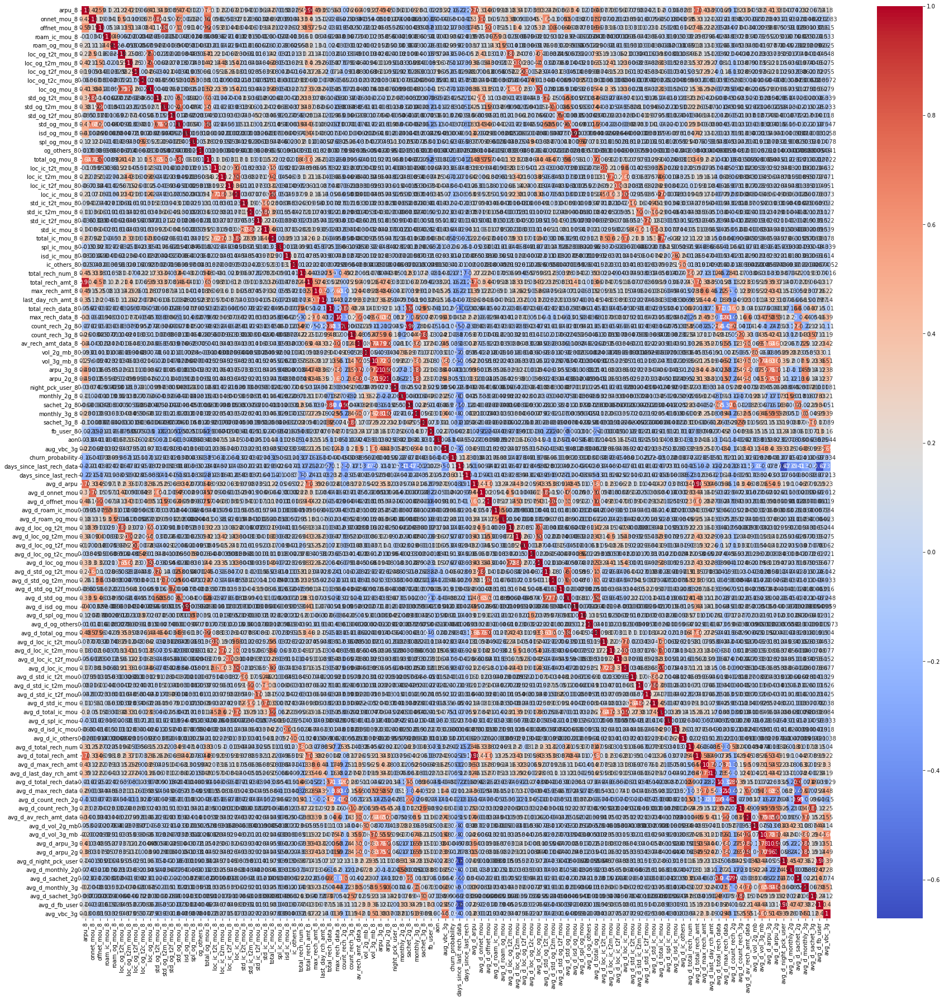

In [30]:
corr_mat = telecom_df.corr()
plt.figure(figsize=(30,30))
sns.heatmap(corr_mat,annot=True,cmap='coolwarm')

In [31]:
def get_redundant_pairs(s):
    '''Get correlation with same pairs remove the values'''
    pairs_to_drop = set()
    cols = s.keys()
    for k1,k2 in cols:
        if(k1==k2):
            pairs_to_drop.add((k1,k2))
    return pairs_to_drop

def get_top_abs_correlations(df, c=0.8):
    corr = df.corr()
    corr_1= corr.where(~np.tril(np.ones(corr.shape)).astype(np.bool_))
    au_corr = corr_1.stack()
    return au_corr[abs(au_corr)>c]


In [32]:
## To understand the highly correlated columns, we are not treating it as PCA and Random Forest will take care of it.
get_top_abs_correlations(telecom_df,c=0.7)

arpu_8                  total_rech_amt_8          0.958333
                        avg_d_arpu                0.764446
                        avg_d_total_rech_amt      0.768843
onnet_mou_8             std_og_t2t_mou_8          0.862759
                        total_og_mou_8            0.756311
                        avg_d_onnet_mou           0.764388
offnet_mou_8            std_og_t2m_mou_8          0.858002
                        total_og_mou_8            0.773046
                        avg_d_offnet_mou          0.734996
loc_og_t2t_mou_8        loc_og_mou_8              0.785726
                        avg_d_loc_og_t2t_mou      0.807468
loc_og_t2m_mou_8        loc_og_mou_8              0.792308
                        avg_d_loc_og_t2m_mou      0.803727
loc_og_t2f_mou_8        avg_d_loc_og_t2f_mou      0.799623
loc_og_mou_8            avg_d_loc_og_mou          0.830325
std_og_t2t_mou_8        std_og_mou_8              0.761291
                        avg_d_std_og_t2t_mou      0.7502

In [33]:
## To understand the highly correlated columns with the target variable
absCorrWithDep={}
y = telecom_df['churn_probability']
X = telecom_df

In [34]:
for col in telecom_df.columns:
    absCorrWithDep[col]=abs(y.corr(X[col]))

In [35]:
dict(sorted(absCorrWithDep.items(), key=lambda item: item[1],reverse=True))

{'churn_probability': 1.0,
 'days_since_last_rech': 0.3277557575279273,
 'total_ic_mou_8': 0.1875655404262014,
 'total_rech_num_8': 0.16704279049807114,
 'total_rech_amt_8': 0.16045479282815195,
 'max_rech_amt_8': 0.15913091605120128,
 'arpu_8': 0.15756638032324105,
 'total_og_mou_8': 0.14932534419555976,
 'last_day_rch_amt_8': 0.13961072163213034,
 'aon': 0.1351769299851386,
 'loc_ic_mou_8': 0.12878413667729902,
 'loc_ic_t2m_mou_8': 0.12484001968856372,
 'loc_og_t2m_mou_8': 0.11330884461236099,
 'days_since_last_rech_data': 0.11232761764649053,
 'loc_og_mou_8': 0.10882141368592474,
 'avg_d_total_ic_mou': 0.10142235529617168,
 'roam_og_mou_8': 0.09870286660181475,
 'avg_d_loc_ic_mou': 0.08612982135506335,
 'avg_d_loc_ic_t2m_mou': 0.086121621440663,
 'roam_ic_mou_8': 0.08576137400016291,
 'avg_d_std_og_mou': 0.08181307902215548,
 'avg_d_roam_og_mou': 0.08134939763312209,
 'avg_d_loc_og_t2m_mou': 0.07754509505444394,
 'avg_d_loc_og_mou': 0.07640677939086866,
 'monthly_2g_8': 0.0762543446

In [36]:
telecom_df.info()
num_cols = list(telecom_df.columns)
num_cols.remove("churn_probability")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Columns: 104 entries, arpu_8 to avg_vbc_3g
dtypes: float64(92), int64(12)
memory usage: 55.5 MB


In [37]:
## Drop columns if it has more than 95% values as empty, immpute the values for remaining.
drop_cols =[]
missing_values_cols =[]
columns_to_impute = []
for col in num_cols:
        missing_percentage = telecom_df[col].isnull().sum()*100/telecom_df.shape[0]
        if(missing_percentage>90):
            drop_cols.append(col)
        else:
            columns_to_impute.append(col)
telecom_df.drop(drop_cols,axis=1,inplace=True)
test_df.drop(drop_cols,axis=1,inplace=True)
print("Columns that are going to be dropped are :",drop_cols)

Columns that are going to be dropped are : []


In [38]:
telecom_df.shape

(69999, 104)

In [39]:
for col in columns_to_impute:
    telecom_df[col].fillna(0,inplace=True)
    if col not  in ['churn_probability']:
        test_df[col].fillna(0,inplace=True)

In [40]:
telecom_df.isnull().sum()

arpu_8                       0
onnet_mou_8                  0
offnet_mou_8                 0
roam_ic_mou_8                0
roam_og_mou_8                0
loc_og_t2t_mou_8             0
loc_og_t2m_mou_8             0
loc_og_t2f_mou_8             0
loc_og_t2c_mou_8             0
loc_og_mou_8                 0
std_og_t2t_mou_8             0
std_og_t2m_mou_8             0
std_og_t2f_mou_8             0
std_og_mou_8                 0
isd_og_mou_8                 0
spl_og_mou_8                 0
og_others_8                  0
total_og_mou_8               0
loc_ic_t2t_mou_8             0
loc_ic_t2m_mou_8             0
loc_ic_t2f_mou_8             0
loc_ic_mou_8                 0
std_ic_t2t_mou_8             0
std_ic_t2m_mou_8             0
std_ic_t2f_mou_8             0
std_ic_mou_8                 0
total_ic_mou_8               0
spl_ic_mou_8                 0
isd_ic_mou_8                 0
ic_others_8                  0
total_rech_num_8             0
total_rech_amt_8             0
max_rech

In [41]:
high_corr_cols = ['days_since_last_rech','total_ic_mou_8','total_rech_num_8','total_rech_amt_8','avg_d_loc_og_mou','aon','avg_d_total_ic_mou','days_since_last_rech_data']

<AxesSubplot:>

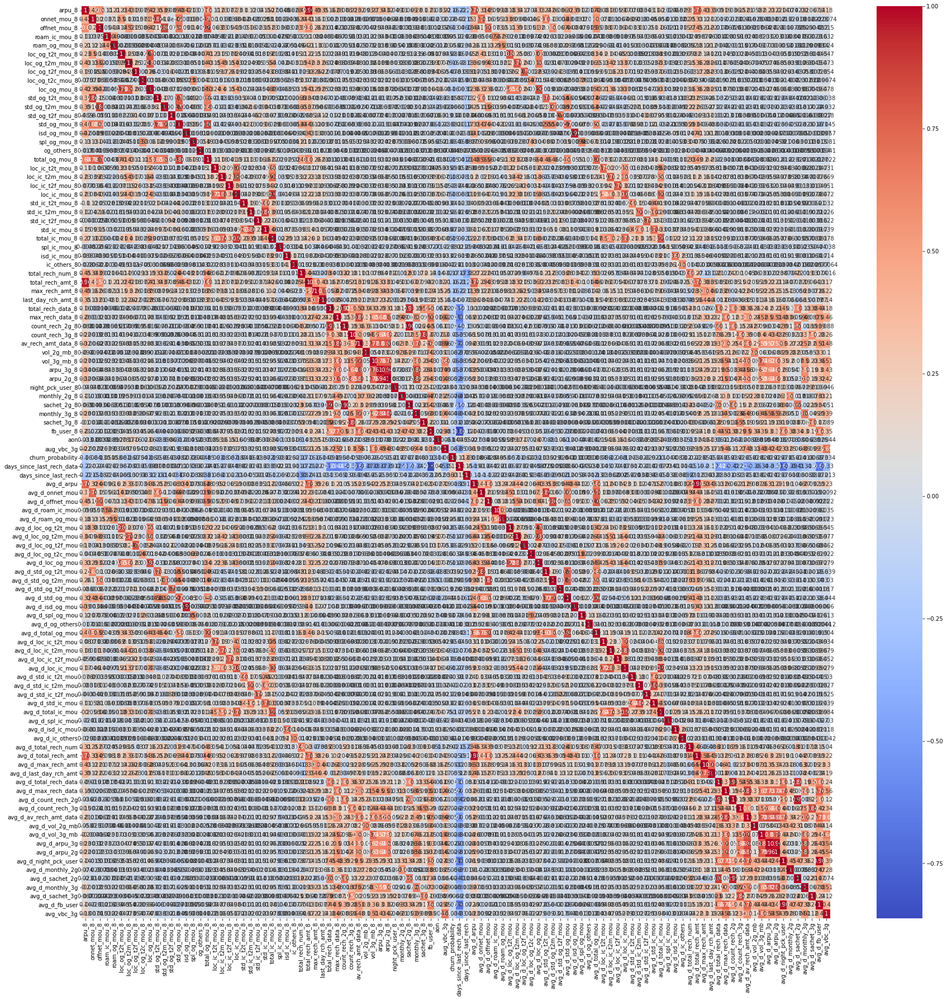

In [42]:
corr_mat = telecom_df.corr()
plt.figure(figsize=(30,30))
sns.heatmap(corr_mat,annot=True,cmap='coolwarm')

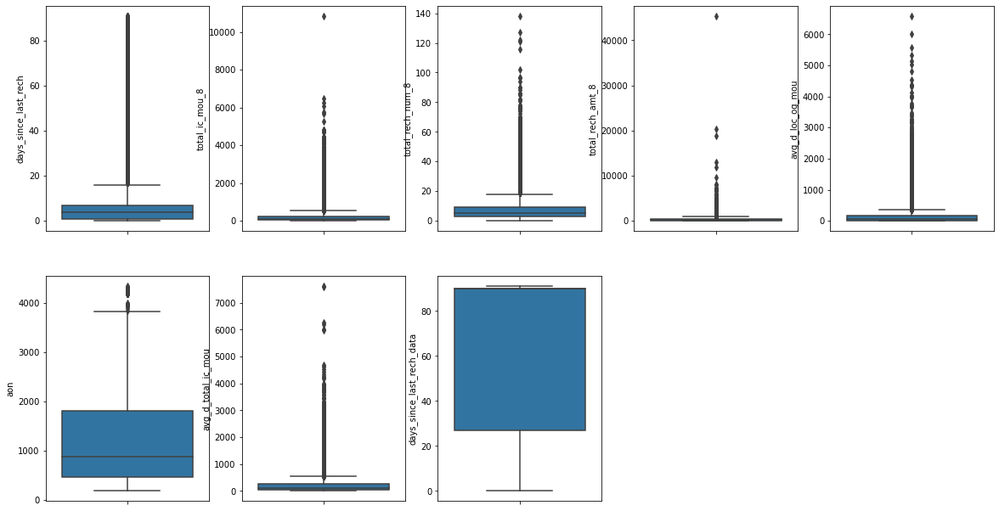

In [43]:
## Understanding the distribution of variables
plt.figure(figsize=(20,40))
i =1

for col in high_corr_cols:
    plt.subplot(7,5,i)
    sns.boxplot(y=col,data=telecom_df)
    i= i +1

In [44]:
def remove_outlier(df,col):
    i_rows,i_cols = df.shape
    Q1=df[col].quantile(0.20)
    Q3= df[col].quantile(0.90)
    IQR = Q3-Q1
    df= df[~((df[col]<(Q1-1.5*IQR)) | (df[col]>(Q3+1.5*IQR)))]
    f_rows,f_cols = df.shape
    print('{} outliers has been removed in {}'.format(i_rows-f_rows,col))
    return df

In [45]:
for col in high_corr_cols:
    telecom_df = remove_outlier(telecom_df,col)


1335 outliers has been removed in days_since_last_rech
1084 outliers has been removed in total_ic_mou_8
809 outliers has been removed in total_rech_num_8
579 outliers has been removed in total_rech_amt_8
1130 outliers has been removed in avg_d_loc_og_mou
0 outliers has been removed in aon
594 outliers has been removed in avg_d_total_ic_mou
0 outliers has been removed in days_since_last_rech_data


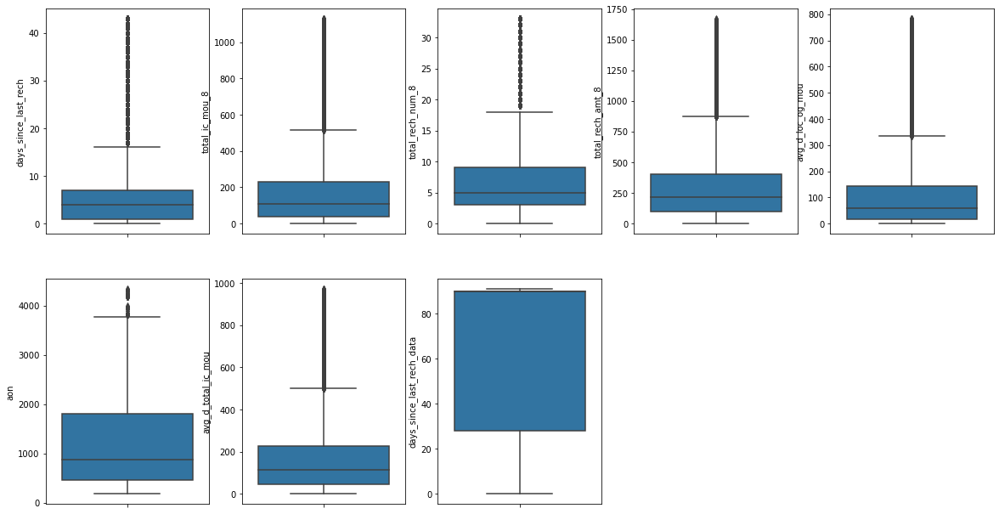

In [46]:
plt.figure(figsize=(20,40))
i =1
## Distribution of the variables
for col in high_corr_cols:
    plt.subplot(7,5,i)
    sns.boxplot(y=col,data=telecom_df)
    i= i +1

In [47]:
f_rows,f_cols = telecom_df.shape
print("Row dropped during processing:",(i_rows-f_rows))
print("Columns dropped during processing:",(i_cols-f_cols))

Row dropped during processing: 5531
Columns dropped during processing: 68


In [48]:
#### Converting to categorical features

In [49]:
for col in cat_cols:
    cat_df = pd.get_dummies(telecom_df[col],prefix=col+"_",drop_first=True)
    telecom_df = pd.concat([telecom_df,cat_df],axis=1)
    cat_df1 = pd.get_dummies(test_df[col],prefix=col+"_",drop_first=True)
    test_df = pd.concat([test_df,cat_df1],axis=1)

In [50]:
telecom_df.shape

(64468, 110)

In [51]:
test_df.shape

(30000, 109)

In [52]:
y=telecom_df.pop('churn_probability')

In [53]:
X= telecom_df

In [54]:
def print_metrics_kpis(y, y_pred):
    confusion = metrics.confusion_matrix(y, y_pred)
    print("Confusion  Matirx",confusion)
    # True Positive
    TP = confusion[1,1]
    # True Negative
    TN = confusion[0,0]
    # False Positive
    FP = confusion[0,1]
    # False Negative
    FN = confusion[1,0]
    print("ROC AUC Score ", (metrics.roc_auc_score(y, y_pred)))
    print("Precision Score", (metrics.precision_score(y, y_pred)))
    print("Sensitivity/Recall ", TP/float(TP + FN))
    print("Specificity ", TN/float(TN + FP))
    print("False positive rate", FP/float(TN+FP))
    print("False negative rate", FN/float(FN+TP))
    print("Positive predictive value ", TP/float(TP+FP))
    print("Negative predictive value ", TN/float(TN+FN))
    print("Accuracy ", metrics.accuracy_score(y, y_pred))

In [55]:
#### Train/Test split 

In [56]:
X_train, X_test, y_train, y_test = train_test_split(telecom_df,y, train_size=0.7,test_size=0.3,random_state=42)

In [57]:
scaler = StandardScaler()
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_test_kaggle = scaler.transform(test_df)

In [58]:
#### Model Building

As it was asked as part of the problem statement it is asked to first perform PCA on the
data set to reduce its dimensionality and build the classification models
1. Logistic Regression Classification
2. Random forest ensemble
3. XGBoost
For each of the classification solution KPIs have to be measured. They are
* Accuracy
* Sensitivity
* Specificity
* Precision
* Recall

In [59]:
## Perform PCA

In [60]:
pca = PCA(svd_solver='randomized', random_state=42)

In [61]:
pca.fit(X_train)

PCA(random_state=42, svd_solver='randomized')

In [62]:
pca.explained_variance_ratio_[:50]

array([0.13972813, 0.1050491 , 0.06928449, 0.05386275, 0.03578999,
       0.03080344, 0.02721832, 0.02593922, 0.02332278, 0.02169791,
       0.02113763, 0.01909576, 0.01829735, 0.0180822 , 0.01789915,
       0.01636859, 0.01451928, 0.0141667 , 0.01296653, 0.01202252,
       0.0116072 , 0.01123978, 0.01097896, 0.0108341 , 0.01077427,
       0.01029419, 0.00996941, 0.00983241, 0.00929158, 0.00914654,
       0.00903373, 0.00870588, 0.00842923, 0.00815052, 0.00800489,
       0.00754396, 0.00736995, 0.00724918, 0.00662336, 0.00628846,
       0.00612145, 0.00608182, 0.00603311, 0.00565201, 0.00555791,
       0.00548565, 0.00533108, 0.00502095, 0.00482448, 0.00476066])

<BarContainer object of 109 artists>

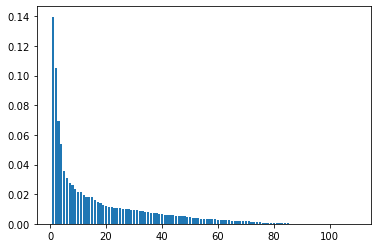

In [63]:
plt.bar(range(1,len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)

In [64]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)

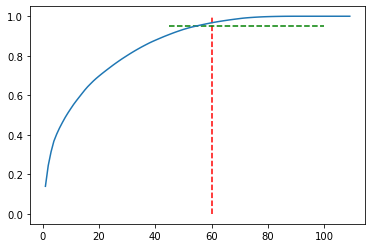

In [65]:
plt.vlines(x=60, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=100,xmin=45, colors="g", linestyles="--")

plt.plot(range(1,len(var_cumu)+1), var_cumu)


In [66]:
pca_final = PCA(n_components=80, random_state=42)

In [67]:
newdata = pca_final.fit_transform(X_train)
newdata_test= pca_final.transform(X_test)
newdata_test_kaggle = pca_final.transform(X_test_kaggle)

In [68]:
newdata.shape

(45127, 80)

In [69]:
cols = ["PC"+str(i) for i in range(1,81)]    

In [70]:
df_train_pca = pd.DataFrame(newdata, columns=cols)
df_train_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80
0,-1.843613,-3.116873,1.463360,-0.973631,-0.239150,0.376968,-0.843090,-0.161503,0.127521,0.245492,0.103949,-1.117128,-1.008676,0.017600,0.297932,0.238655,-0.082778,0.001833,0.742059,0.227826,0.369724,0.716806,-0.103270,0.229222,-0.265348,0.926031,-0.823342,0.322009,0.604548,-0.422013,0.387880,-0.544052,-0.081488,-0.020196,1.251291,-1.580492,0.047088,-1.200667,0.364706,0.396966,0.262985,-0.302466,-0.027921,-0.126315,0.678220,-0.438930,-0.734447,-0.177298,-0.262194,-0.073872,0.061596,0.179469,-0.529767,-0.193623,-0.077365,-0.102836,1.263714,0.079921,-0.022309,-0.147835,-0.046506,-0.013931,-0.335028,-0.406689,-0.168100,0.073551,0.032720,0.241010,0.217751,0.301202,0.010096,-0.040216,0.205712,-0.346794,0.302524,-0.083523,-0.161731,0.034619,-0.251937,0.067845
1,-0.108262,4.303272,-2.955117,-0.582097,-0.642650,0.314051,2.287709,0.846070,0.605997,-0.073931,0.544364,-1.784925,-0.094421,-0.541504,-0.019855,0.137621,-0.128094,-0.011774,-2.128134,0.518190,-0.182430,-0.143998,-0.043050,0.015894,-0.128472,0.068526,0.147898,-0.486982,0.178669,-0.013679,0.333429,0.056612,0.465118,0.282914,0.160389,1.102119,0.149645,-0.260867,-0.502684,0.194961,0.080759,0.112489,-0.536997,0.439589,0.709398,-0.014978,0.346390,-0.187849,0.320162,0.154468,-0.074969,-0.101335,0.174169,0.569940,-0.547771,0.165092,-0.086432,-0.109141,-0.240815,-0.265816,-0.026084,-0.558551,0.391470,-0.407232,0.179800,-0.702456,0.024472,-0.252466,-0.424929,-0.002452,0.235586,0.680103,-0.015599,-0.029606,-0.056560,0.027683,0.234941,0.012459,-0.095425,0.028445
2,-0.081213,-3.177980,-0.302372,0.963612,-0.296624,-2.096018,-1.975589,0.622821,-0.074600,0.320995,-0.098881,-1.312306,-0.459572,-1.211258,1.756180,0.116977,0.700611,-0.062599,-0.272059,1.258297,-0.747190,0.010786,1.184081,-0.702008,0.370316,0.651695,-0.056570,0.468102,-0.062162,0.256244,-0.290198,-0.486374,-0.094778,0.903593,1.349124,-1.068882,1.583101,-0.034924,-1.480662,-0.426093,0.052636,-0.210621,-0.300247,0.480717,-0.824692,0.653591,0.318011,-0.308859,0.255039,0.142184,-0.020473,-0.182591,-0.688097,-0.693323,-0.659782,-0.370135,0.724459,-0.118169,0.021965,-0.239981,-0.183656,0.460940,0.368783,0.232624,-0.284068,-0.268846,-0.177334,-0.342116,0.071029,-0.021924,0.363699,-0.204579,-0.066672,-0.343667,0.450517,-0.285742,0.145507,-0.073241,0.390087,-0.075917
3,-3.113043,-2.206129,-0.201988,0.519720,-0.338395,0.195643,0.592685,-0.170030,0.162194,-0.034770,-0.054768,-0.353719,-0.145858,-0.090232,-0.153402,-0.095908,-0.270928,-0.030426,0.131732,-0.059518,-0.189156,-0.240843,-0.019302,-0.037272,0.014347,-0.445723,0.368527,0.089832,0.000072,-0.007143,0.041889,-0.278175,-0.039556,0.000190,0.106460,0.190565,-0.136050,0.277845,-0.198806,0.256837,0.070926,-0.055651,0.050963,0.301941,0.273056,-0.217350,0.346236,-0.047354,0.033108,0.056844,0.069246,0.011676,0.001722,-0.072355,0.399799,-0.111715,-0.108886,0.015561,0.112549,0.198419,0.120780,-0.309555,-0.039033,0.014977,-0.059968,-0.150599,0.151243,0.185152,0.203964,0.150130,-0.249657,-0.252186,-0.057158,-0.084935,0.001040,-0.000601,0.056231,-0.037888,-0.014545,0.000536
4,-3.319459,-2.360650,0.946549,0.530362,-0.272601,0.532863,0.178945,0.227648,0.496012,0.346496,-0.022414,0.174431,-0.157721,0.109463,-0.181939,0.090462,-0.277461,0.096755,0.367204,-0.090456,0.101526,-0.036474,0.021844,0.065300,0.007674,0.045852,0.157705,-0.000279,-0.099901,0.000696,-0.044611,-0.179937,0.190501,-0.000327,0.431110,-0.654356,-0.279640,0.328098,0.096112,0.276315,0.430327,-0.375128,-0.081320,0.001814,-0.303946,-0.395649,0.119652,0.087772,-0.051449,0.035151,0.014800,0.003466,0.157732,-0.048924,0.035429,0.049411,-0.149273,0.070941,

In [71]:
newdata.shape

(45127, 80)

In [72]:
df_test_pca = pd.DataFrame(newdata_test, columns=cols)
df_test_pca.shape

(19341, 80)

In [73]:
corrmat = np.corrcoef(df_train_pca.transpose())

In [74]:
corrmat.shape

(80, 80)

In [75]:
## Logistic Regression

In [76]:
learner_pca2 = LogisticRegression(class_weight = 'balanced')
learner_pca2.fit(df_train_pca, y_train)

LogisticRegression(class_weight='balanced')

In [77]:
y_train_pred = learner_pca2.predict(df_train_pca)
y_train_pred_prob = learner_pca2.predict_proba(df_train_pca)[:,1]

In [78]:
y_train_pred = learner_pca2.predict_proba(df_train_pca)[:,1]
y_train_pred_df = pd.DataFrame({'churn':y_train, 'churn_prob':y_train_pred})
y_train_pred_df['predicted'] = y_train_pred_df.churn_prob.map(lambda x : 1 if x > 0.5 else 0)
y_train_pred_df[y_train_pred_df['churn'] == 1].head(10)
                                

,churn,churn_prob,predicted
56521,1,0.836685,1
67240,1,0.687231,1
36335,1,0.834402,1
30059,1,0.404577,0
52255,1,0.316162,0
28993,1,0.722888,1
67425,1,0.873217,1
66316,1,0.786117,1
42942,1,0.801021,1
5990,1,0.752099,1


In [79]:
y_test_pred = learner_pca2.predict(df_test_pca)
print_metrics_kpis(y_test,y_test_pred)


Confusion  Matirx [[13936  3648]
 [  287  1470]]
ROC AUC Score  0.8145960289868733
Precision Score 0.28722157092614303
Sensitivity/Recall  0.8366533864541833
Specificity  0.7925386715195633
False positive rate 0.20746132848043677
False negative rate 0.16334661354581673
Positive predictive value  0.28722157092614303
Negative predictive value  0.9798214160163116
Accuracy  0.796546197197663


In [80]:
# create a list with different probabilities range
prob_range = [round(float(p)/10, 2) for p in range(10)]

In [81]:
for idx in prob_range:
    #print(idx)
    y_train_pred_df[idx] = y_train_pred_df.churn_prob.map(lambda x: 1 if x > idx else 0)
y_train_pred_df.head()

,churn,churn_prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
22951,0,0.518119,1,1,1,1,1,1,1,0,0,0,0
30017,0,0.046643,0,1,0,0,0,0,0,0,0,0,0
816,0,0.554873,1,1,1,1,1,1,1,0,0,0,0
69022,0,0.739255,1,1,1,1,1,1,1,1,1,0,0
54129,0,0.709754,1,1,1,1,1,1,1,1,1,0,0


     Prob  Accuracy  Sensitivity  Specificity
0.0   0.0  0.095331     1.000000     0.000000
0.1   0.1  0.441066     0.976987     0.384593
0.2   0.2  0.564075     0.953742     0.523013
0.3   0.3  0.657456     0.927940     0.628953
0.4   0.4  0.736898     0.893538     0.720392
0.5   0.5  0.800829     0.855649     0.795052
0.6   0.6  0.852771     0.801023     0.858224
0.7   0.7  0.893456     0.715016     0.912260
0.8   0.8  0.913201     0.503022     0.956424
0.9   0.9  0.912159     0.218038     0.985303


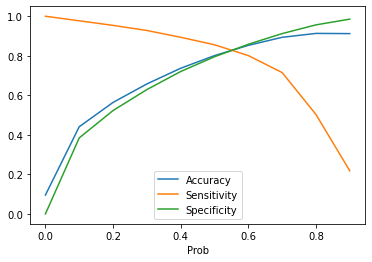

In [82]:
# Now let us find the accuracy, sensitivity and specificity for each of the cut-off values
metr_df = pd.DataFrame(columns=['Prob', 'Accuracy', 'Sensitivity', 'Specificity'])
for prob in prob_range:
    cm = metrics.confusion_matrix(y_train_pred_df.churn, y_train_pred_df[prob])
    TN = cm[0,0]
    FP = cm[0,1]
    FN = cm[1,0]
    TP = cm[1,1]
    acc = (TP + TN)/(TP + TN + FP + FN)
    speci = (TN/(TN + FP))
    sensi = (TP/(TP + FN))
    metr_df.loc[prob] = [prob, acc, sensi, speci]
print(metr_df)
metr_df.plot.line(x='Prob', y=['Accuracy', 'Sensitivity', 'Specificity'])
plt.show()

In [83]:
y_train_pred = learner_pca2.predict_proba(df_train_pca)[:,1]
y_train_pred_df = pd.DataFrame({'churn':y_train, 'churn_prob':y_train_pred})
y_train_pred_df['final_pred'] = y_train_pred_df.churn_prob.map(lambda x: 1 if x > 0.40 else 0)
y_train_pred_df

,churn,churn_prob,final_pred
22951,0,5.181190e-01,1
30017,0,4.664306e-02,0
816,0,5.548730e-01,1
69022,0,7.392548e-01,1
54129,0,7.097538e-01,1
56521,1,8.366852e-01,1
13536,0,4.227508e-01,1
4617,0,2.986331e-01,0
53397,0,5.957674e-01,1
15043,0,3.365741e-01,0


In [84]:
## Building model with SVM

In [85]:
svm_model = svm.SVC(C=0.1, gamma = 0.5, kernel =  'linear', probability=True, random_state=100)
svm_model.fit(X_train, y_train)

SVC(C=0.1, gamma=0.5, kernel='linear', probability=True, random_state=100)

In [86]:
y_train_predict_svm = svm_model.predict(X_train)

In [87]:
print_metrics_kpis(y_train, y_train_predict_svm)

Confusion  Matirx [[40816     9]
 [ 4273    29]]
ROC AUC Score  0.5032602987602001
Precision Score 0.7631578947368421
Sensitivity/Recall  0.006741050674105067
Specificity  0.9997795468462951
False positive rate 0.00022045315370483771
False negative rate 0.993258949325895
Positive predictive value  0.7631578947368421
Negative predictive value  0.905231874736632
Accuracy  0.9051122387927405


In [88]:
# Evaluate the model on test data set
y_test_pred_svm = svm_model.predict(X_test)

In [89]:
print_metrics_kpis(y_test, y_test_pred_svm)

Confusion  Matirx [[17583     1]
 [ 1748     9]]
ROC AUC Score  0.5025327488952289
Precision Score 0.9
Sensitivity/Recall  0.005122367672168469
Specificity  0.9999431301182894
False positive rate 5.6869881710646044e-05
False negative rate 0.9948776323278316
Positive predictive value  0.9
Negative predictive value  0.9095752935699136
Accuracy  0.9095703427950985


In [90]:
## Random Forest

In [91]:
rf = RandomForestClassifier(n_estimators=10, max_depth=4, max_features=5, random_state=100, oob_score=True)

In [92]:
%%time
rf.fit(X_train, y_train)

Wall time: 633 ms


RandomForestClassifier(max_depth=4, max_features=5, n_estimators=10,
                       oob_score=True, random_state=100)

In [93]:
rf.oob_score_

0.9337868681720478

In [94]:
y_test_rf=rf.predict(X_test)

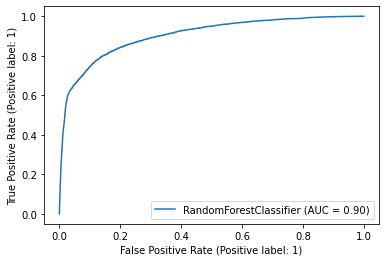

In [95]:
plot_roc_curve(rf, X_train, y_train)
plt.show()

In [96]:
confusion_matrix(y_test,y_test_rf)

array([[17321,   263],
       [  933,   824]], dtype=int64)

In [97]:
precision_score(y_test,y_test_rf)

0.7580496780128795

In [98]:
### Hyper parameter tuning for random forest

In [99]:
rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [100]:
params = {
    'max_depth': [2,3,5,10,20],
    'min_samples_leaf': [5,10,20,50,100],
    'n_estimators': [50, 100]
}

In [101]:
grid_search = GridSearchCV(estimator=rf,
                           param_grid=params,
                           cv = 4,
                           n_jobs=-1, verbose=1, scoring="accuracy")

In [102]:
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 50 candidates, totalling 200 fits


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100],
                         'n_estimators': [50, 100]},
             scoring='accuracy', verbose=1)

In [103]:
grid_search.best_score_

0.9399029562157003

In [104]:
rf_best = grid_search.best_estimator_
rf_best

RandomForestClassifier(max_depth=20, min_samples_leaf=5, n_jobs=-1,
                       random_state=42)

In [105]:
y_test_rf=rf_best.predict(X_test)
y_test_kaggle=rf_best.predict(X_test_kaggle)

In [106]:
pd.DataFrame(data=y_test_kaggle).to_csv("sample.csv")

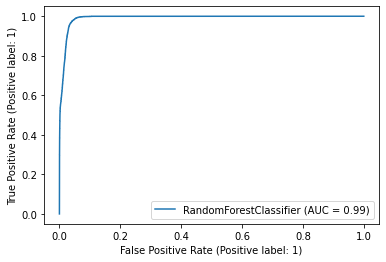

In [107]:
plot_roc_curve(rf_best, X_train, y_train)
plt.show()

In [108]:
imp_df = pd.DataFrame({
     "Varname": telecom_df.columns,
     "Imp": rf_best.feature_importances_
})

In [109]:
precision_score(y_test,y_test_rf)

0.7435697583787997

In [110]:
recall_score(y_test,y_test_rf)

0.5429709732498577

In [111]:
print(classification_report(y_test,y_test_rf))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97     17584
           1       0.74      0.54      0.63      1757

    accuracy                           0.94     19341
   macro avg       0.85      0.76      0.80     19341
weighted avg       0.94      0.94      0.94     19341



In [112]:
imp_df.sort_values(by="Imp", ascending=False)

,Varname,Imp
21,loc_ic_mou_8,0.089762
19,loc_ic_t2m_mou_8,0.085595
26,total_ic_mou_8,0.069175
9,loc_og_mou_8,0.050701
17,total_og_mou_8,0.041852
6,loc_og_t2m_mou_8,0.033155
18,loc_ic_t2t_mou_8,0.031218
31,total_rech_amt_8,0.029928
0,arpu_8,0.027811
2,offnet_mou_8,0.025536


In [113]:
import xgboost as xgb

In [114]:
xgb_cfl = xgb.XGBClassifier(n_jobs = -1,objective = 'binary:logistic')
xgb_cfl.get_params()

{'objective': 'binary:logistic',
 'use_label_encoder': True,
 'base_score': None,
 'booster': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'enable_categorical': False,
 'gamma': None,
 'gpu_id': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_delta_step': None,
 'max_depth': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 100,
 'n_jobs': -1,
 'num_parallel_tree': None,
 'predictor': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

In [115]:
# Fit the model to our train and target
xgb_cfl.fit(X_train, y_train)  # default 
# Get our predictions
xgb_predictions = xgb_cfl.predict(X_test)
xgb_predictions_kaggle = xgb_cfl.predict(X_test_kaggle)

[15:11:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [116]:
accuracy_score(y_test, xgb_predictions)

0.9384209709942609

In [117]:
# A parameter grid for XGBoost
params = {
        'n_estimators' : [500], # no of trees 
        'learning_rate' : [0.01, 0.02, 0.1, 0.25],  # eta
        'min_child_weight': [1, 5, 7, 10],
        'gamma': [0.1, 0.5, 1, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 10, 12]
        }

folds = 5

In [118]:
param_comb =5

random_search = RandomizedSearchCV(xgb_cfl, param_distributions=params, n_iter=param_comb, scoring='accuracy', n_jobs=-1, cv=3, verbose=3, random_state=42)

In [119]:
random_search.fit(X_train,y_train)

Fitting 3 folds for each of 5 candidates, totalling 15 fits
[15:35:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1,
                                           enable_categorical=False, gamma=0,
                                           gpu_id=-1, importance_type=None,
                                           interaction_constraints='',
                                           learning_rate=0.300000012,
                                           max_delta_step=0, max_depth=6,
                                           min_child_weight=1, missing=nan,
                                           monotone_constraints='()',
                                           n_estimat...
                                           scale_pos_weight=1, subsample=1,
                                           tree_method='exact

In [120]:
print('\n Best estimator:')
print(random_search.best_estimator_)
print('\n Best accuracy for %d-fold search with %d parameter combinations:' % (folds, param_comb))
print(random_search.best_score_ )
print('\n Best hyperparameters:')
print(random_search.best_params_)


 Best estimator:
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1.0,
              enable_categorical=False, gamma=1, gpu_id=-1,
              importance_type=None, interaction_constraints='',
              learning_rate=0.01, max_delta_step=0, max_depth=10,
              min_child_weight=7, missing=nan, monotone_constraints='()',
              n_estimators=500, n_jobs=-1, num_parallel_tree=1,
              predictor='auto', random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=0.8, tree_method='exact',
              validate_parameters=1, verbosity=None)

 Best accuracy for 5-fold search with 5 parameter combinations:
0.940545529590573

 Best hyperparameters:
{'subsample': 0.8, 'n_estimators': 500, 'min_child_weight': 7, 'max_depth': 10, 'learning_rate': 0.01, 'gamma': 1, 'colsample_bytree': 1.0}


In [121]:
xgb_predictions_hpt = random_search.predict(X_test)
xgb_predictions_hpt_kaggle = random_search.predict(X_test_kaggle)
accuracy_score(y_test, xgb_predictions_hpt)

0.9437464453751099

In [122]:
confusion_matrix(y_test,xgb_predictions_hpt)

array([[17196,   388],
       [  700,  1057]], dtype=int64)

In [123]:
print(classification_report(y_test,xgb_predictions_hpt))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97     17584
           1       0.73      0.60      0.66      1757

    accuracy                           0.94     19341
   macro avg       0.85      0.79      0.81     19341
weighted avg       0.94      0.94      0.94     19341



In [124]:
pd.DataFrame(xgb_predictions_hpt_kaggle).to_csv("Submission.csv")

In [125]:
#Using adaBoosting to predict 'Attrition' 
adaboost =  AdaBoostClassifier(n_estimators=200, random_state=1)

In [126]:
#Fitting Model
adaboost.fit(X_train, y_train)

AdaBoostClassifier(n_estimators=200, random_state=1)

In [127]:
#pred
y_pred_ada = adaboost.predict(X_test)

In [128]:
print('Accuracy of the model is:  ',accuracy_score(y_test, y_pred_ada))

Accuracy of the model is:   0.9363011219688744


In [129]:
print_metrics_kpis(y_test,y_pred_ada)

Confusion  Matirx [[17148   436]
 [  796   961]]
ROC AUC Score  0.761079884284518
Precision Score 0.6879026485325698
Sensitivity/Recall  0.5469550369948777
Specificity  0.9752047315741583
False positive rate 0.024795268425841673
False negative rate 0.45304496300512237
Positive predictive value  0.6879026485325698
Negative predictive value  0.9556397681676326
Accuracy  0.9363011219688744
